In [49]:
# Thư viện
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l1, l2, l1_l2
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [50]:
import pandas as pd

# Tải tệp csv
file_path = r"D:\projects\Automatic_Driving_System\Data\driving_log.csv"
data = pd.read_csv(file_path)
data.head(5)


,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2023_12_08_13_45_00_325.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2023_12_08_13_45_00_325.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2023_12_08_13_45_00_325.jpg,0,0.1,0.2,1.10E-05
0,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2023_12_08_13_45_00_395.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2023_12_08_13_45_00_395.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2023_12_08_13_45_00_395.jpg,0.0,0.0,0.0,0.000004
1,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2023_12_08_13_45_00_463.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2023_12_08_13_45_00_463.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2023_12_08_13_45_00_463.jpg,0.0,0.0,0.0,0.000017
2,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2023_12_08_13_45_00_531.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2023_12_08_13_45_00_531.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2023_12_08_13_45_00_531.jpg,0.0,0.0,0.0,0.000023
3,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2023_12_08_13_45_00_600.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2023_12_08_13_45_00_600.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2023_12_08_13_45_00_600.jpg,0.0,0.0,0.0,0.000018
4,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2023_12_08_13_45_00_672.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2023_12_08_13_45_00_672.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2023_12_08_13_45_00_672.jpg,0.0,0.0,0.0,0.000012


In [51]:
# Gán tên mới cho các cột
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data.columns = columns

# Điều chỉnh độ rộng tối đa cho hiển thị của mỗi cột
# Điều chỉnh độ rộng tối đa là 100
pd.set_option('display.max_colwidth', 100)  # Hoặc một số lớn khác

data.head()

,center,left,right,steering,throttle,reverse,speed
0,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2023_12_08_13_45_00_395.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2023_12_08_13_45_00_395.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2023_12_08_13_45_00_395.jpg,0.0,0.0,0.0,0.000004
1,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2023_12_08_13_45_00_463.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2023_12_08_13_45_00_463.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2023_12_08_13_45_00_463.jpg,0.0,0.0,0.0,0.000017
2,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2023_12_08_13_45_00_531.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2023_12_08_13_45_00_531.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2023_12_08_13_45_00_531.jpg,0.0,0.0,0.0,0.000023
3,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2023_12_08_13_45_00_600.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2023_12_08_13_45_00_600.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2023_12_08_13_45_00_600.jpg,0.0,0.0,0.0,0.000018
4,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\center_2023_12_08_13_45_00_672.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\left_2023_12_08_13_45_00_672.jpg,D:\term1-simulator-windows\beta_simulator_windows\Data\IMG\right_2023_12_08_13_45_00_672.jpg,0.0,0.0,0.0,0.000012


In [52]:

# Hàm để lấy tên tệp từ đường dẫn đầy đủ
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail

# Áp dụng hàm này cho các cột 'center', 'left', 'right'
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)

# Hiển thị 5 dòng đầu tiên để kiểm tra
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_12_08_13_45_00_395.jpg,left_2023_12_08_13_45_00_395.jpg,right_2023_12_08_13_45_00_395.jpg,0.0,0.0,0.0,0.000004
1,center_2023_12_08_13_45_00_463.jpg,left_2023_12_08_13_45_00_463.jpg,right_2023_12_08_13_45_00_463.jpg,0.0,0.0,0.0,0.000017
2,center_2023_12_08_13_45_00_531.jpg,left_2023_12_08_13_45_00_531.jpg,right_2023_12_08_13_45_00_531.jpg,0.0,0.0,0.0,0.000023
3,center_2023_12_08_13_45_00_600.jpg,left_2023_12_08_13_45_00_600.jpg,right_2023_12_08_13_45_00_600.jpg,0.0,0.0,0.0,0.000018
4,center_2023_12_08_13_45_00_672.jpg,left_2023_12_08_13_45_00_672.jpg,right_2023_12_08_13_45_00_672.jpg,0.0,0.0,0.0,0.000012


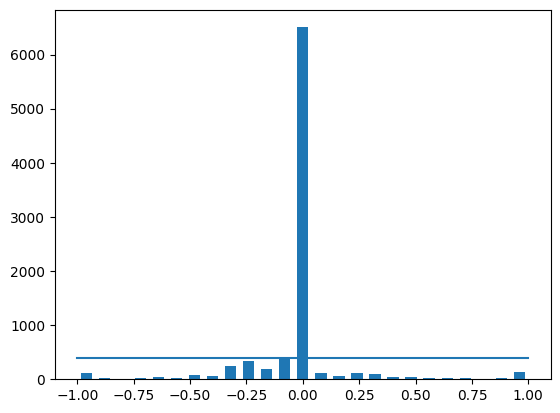

In [53]:
# Thiết lập số lượng bins và mẫu mỗi bin
num_bins = 25
samples_per_bin = 400

# Tính toán histogram
hist, bins = np.histogram(data['steering'], num_bins)

# Tính toán trung tâm của mỗi bin
center = (bins[:-1] + bins[1:]) * 0.5

# Vẽ biểu đồ bar
plt.bar(center, hist, width=0.05)

# Vẽ một đường ngang tại mức samples_per_bin
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

# Hiển thị biểu đồ
plt.show()


In [54]:
print('total data:', len(data))
data.shape

total data: 8701


(8701, 7)

In [55]:
# Giảm số lượng mẫu trong mỗi "bin" (khoảng giá trị) của histogram xuống một ngưỡng cụ thể
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if bins[j] <= data['steering'].iloc[i] < bins[j+1]:
            list_.append(i)
    shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))


removed: 6104
remaining: 2597


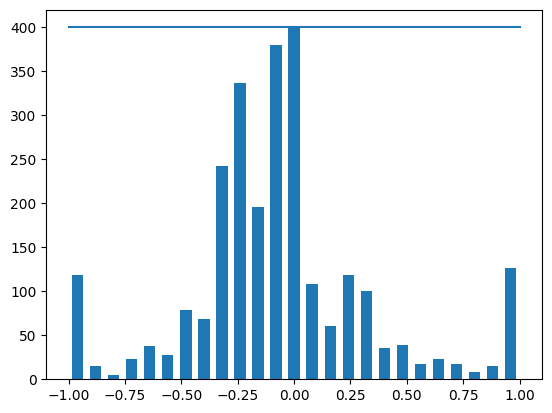

In [56]:
# Tính toán histogram mới
hist, bins = np.histogram(data['steering'], num_bins)

# Tính toán trung tâm của mỗi bin
center = (bins[:-1] + bins[1:]) * 0.5

# Vẽ biểu đồ bar cho histogram
plt.bar(center, hist, width=0.05)

# Vẽ một đường ngang tại mức samples_per_bin
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

# Hiển thị biểu đồ
plt.show()


In [57]:
# Tạo ra hai danh sách: “image_paths” và “steerings”. 
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(df)):
        indexed_data = df.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        # left image append
        image_path.append(os.path.join(datadir, left.strip()))
        steering.append(float(indexed_data[3]) + 0.15)
        # right image append
        image_path.append(os.path.join(datadir, right.strip()))
        steering.append(float(indexed_data[3]) - 0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

In [58]:
datadir = r"D:\projects\Automatic_Driving_System\Data"
# Tạo dữ liệu hình ảnh và giá trị lái
image_paths, steerings = load_img_steering(datadir + '\IMG', data)

C:\Users\HELLO\AppData\Local\Temp\ipykernel_16960\853797113.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
C:\Users\HELLO\AppData\Local\Temp\ipykernel_16960\853797113.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
C:\Users\HELLO\AppData\Local\Temp\ipykernel_16960\853797113.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

In [59]:
image_paths


array(['D:\\projects\\Automatic_Driving_System\\Data\\IMG\\center_2023_12_08_13_45_00_395.jpg',
       'D:\\projects\\Automatic_Driving_System\\Data\\IMG\\left_2023_12_08_13_45_00_395.jpg',
       'D:\\projects\\Automatic_Driving_System\\Data\\IMG\\right_2023_12_08_13_45_00_395.jpg',
       ...,
       'D:\\projects\\Automatic_Driving_System\\Data\\IMG\\center_2023_12_08_13_55_18_375.jpg',
       'D:\\projects\\Automatic_Driving_System\\Data\\IMG\\left_2023_12_08_13_55_18_375.jpg',
       'D:\\projects\\Automatic_Driving_System\\Data\\IMG\\right_2023_12_08_13_55_18_375.jpg'],
      dtype='<U80')

In [60]:
steerings

array([ 0.  ,  0.15, -0.15, ...,  1.  ,  1.15,  0.85])

In [61]:
# Phân chia dữ liệu thành tập đào tạo và kiểm thử
X_train, X_test, y_train, y_test = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)

# In số lượng mẫu đào tạo và kiểm thử
print('Training Samples: {}\nTest Samples: {}'.format(len(X_train), len(X_test)))


Training Samples: 6232
Test Samples: 1559


Text(0.5, 1.0, 'Testing set')

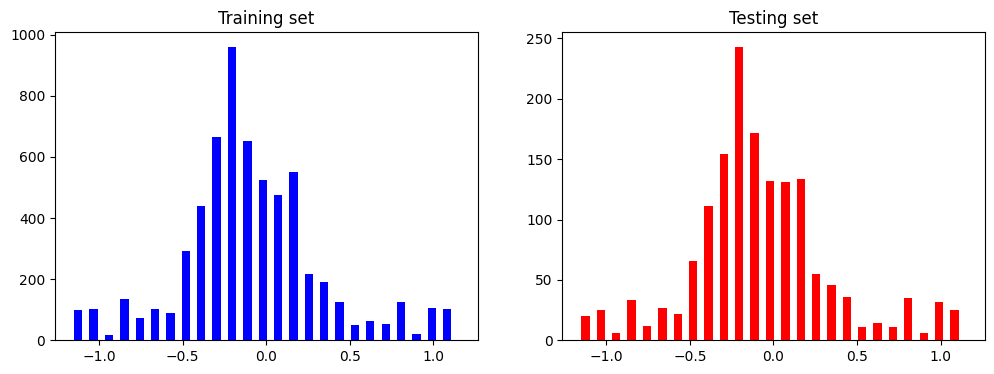

In [62]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_test, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Testing set')

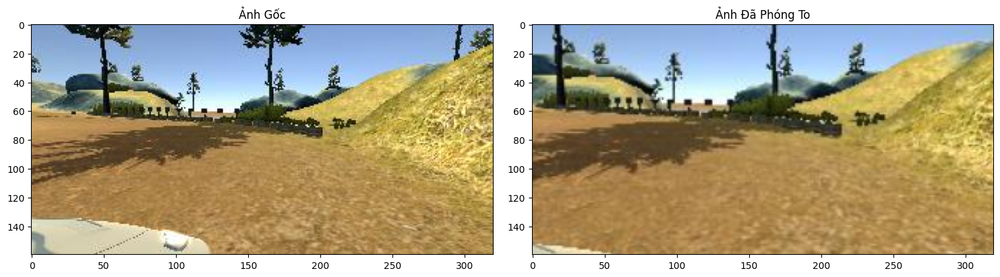

In [63]:
# Phóng to ảnh
def zoom(image):
    zoom_aug = iaa.Affine(scale=(1.3, 1.3))  # Phóng to đồng đều
    return zoom_aug.augment_image(image)

if len(image_paths) > 0:
    image_path = image_paths[random.randint(0, len(image_paths) - 1)]
    try:
        original_image = mpimg.imread(image_path)
        zoomed_image = zoom(original_image)

        fig, axs = plt.subplots(1, 2, figsize=(15, 10))
        fig.tight_layout()

        axs[0].imshow(original_image)
        axs[0].set_title('Ảnh Gốc')

        axs[1].imshow(zoomed_image)
        axs[1].set_title('Ảnh Đã Phóng To')

        plt.show()
    except IOError:
        print("Không thể đọc ảnh từ đường dẫn:", image_path)
else:
    print("Không có ảnh trong danh sách image_paths.")

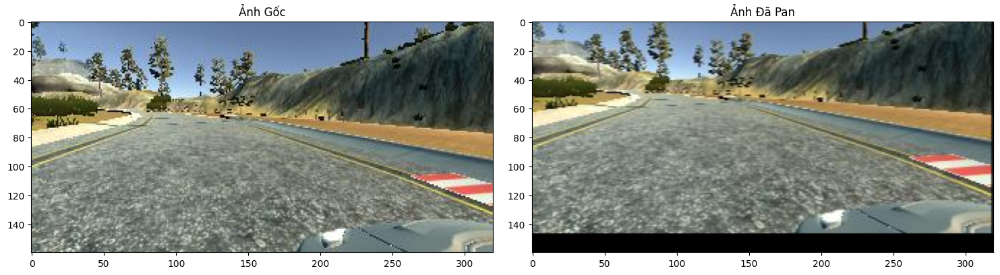

In [64]:
# Thực hiện di chuyển ảnh
def pan(image):
    pan_aug = iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)})
    return pan_aug.augment_image(image)

if len(image_paths) > 0:
    random_index = random.randint(0, len(image_paths) - 1)
    image_path = image_paths[random_index]
    try:
        original_image = mpimg.imread(image_path)
        panned_image = pan(original_image)

        fig, axs = plt.subplots(1, 2, figsize=(15, 10))
        fig.tight_layout()

        axs[0].imshow(original_image)
        axs[0].set_title('Ảnh Gốc')

        axs[1].imshow(panned_image)
        axs[1].set_title('Ảnh Đã Pan')

        plt.show()
    except FileNotFoundError:
        print(f"Không thể tìm thấy tệp: {image_path}")
else:
    print("Không có ảnh trong danh sách image_paths.")

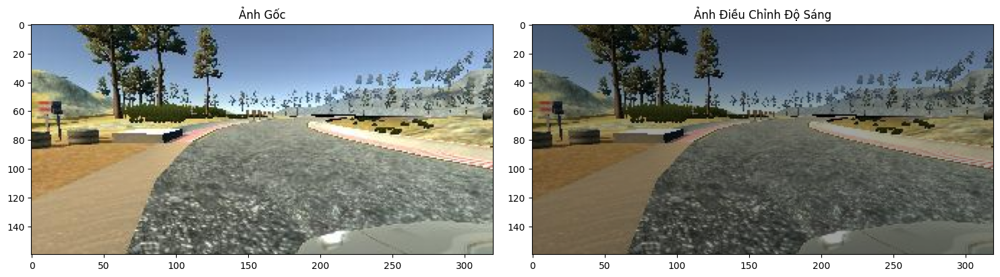

In [65]:
# Điều chỉnh độ sáng cho ảnh
def img_random_brightness(image):
    brightness_aug = iaa.Multiply((0.2, 1.2))
    return brightness_aug.augment_image(image)

if len(image_paths) > 0:
    random_index = random.randint(0, len(image_paths) - 1)
    image_path = image_paths[random_index]
    try:
        original_image = mpimg.imread(image_path)
        brightness_altered_image = img_random_brightness(original_image)

        fig, axs = plt.subplots(1, 2, figsize=(15, 10))
        fig.tight_layout()

        axs[0].imshow(original_image)
        axs[0].set_title('Ảnh Gốc')

        axs[1].imshow(brightness_altered_image)
        axs[1].set_title('Ảnh Điều Chỉnh Độ Sáng')

        plt.show()
    except FileNotFoundError:
        print(f"Không thể tìm thấy tệp: {image_path}")
else:
    print("Không có ảnh trong danh sách image_paths.")

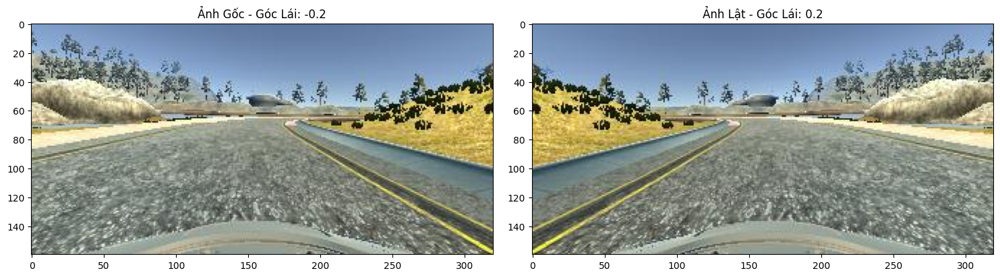

In [66]:
# Lật ảnh (flip) theo chiều ngang và đồng thời đảo ngược giá trị góc lái xe tương ứng
def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1)
    steering_angle = -steering_angle
    return image, steering_angle

if len(image_paths) > 0 and len(steerings) > 0:
    random_index = random.randint(0, len(image_paths) - 1)
    image_path = image_paths[random_index]
    steering_angle = steerings[random_index]

    try:
        original_image = mpimg.imread(image_path)
        flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

        fig, axs = plt.subplots(1, 2, figsize=(15, 10))
        fig.tight_layout()

        axs[0].imshow(original_image)
        axs[0].set_title('Ảnh Gốc - Góc Lái: ' + str(steering_angle))

        axs[1].imshow(flipped_image)
        axs[1].set_title('Ảnh Lật - Góc Lái: ' + str(flipped_steering_angle))

        plt.show()
    except FileNotFoundError:
        print(f"Không thể tìm thấy tệp: {image_path}")
else:
    print("Danh sách image_paths hoặc steerings trống.")

In [67]:
# Thực hiện tăng cường dữ liệu bằng cách thực hiện các phép biến đổi ngẫu nhiên trên ảnh và góc lái (steering angle)
def random_augment(image_path, steering_angle):
    if not os.path.isfile(image_path):
        raise FileNotFoundError(f"Không tìm thấy tệp ảnh: {image_path}")
    
    image = mpimg.imread(image_path)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

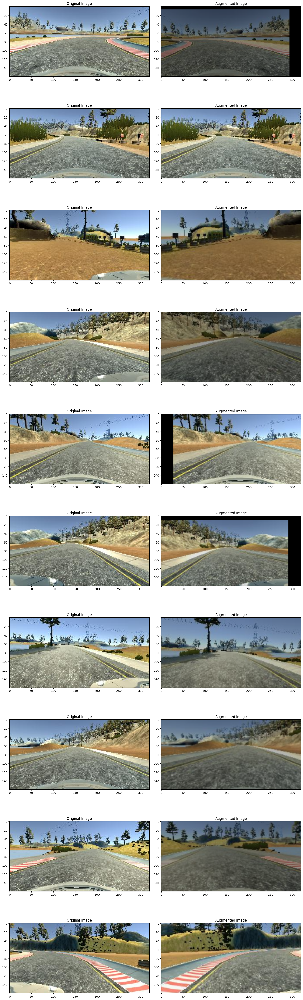

In [68]:
# Hiển thị một loạt các ảnh gốc và ảnh đã qua biến đổi (augmentation) cùng với giá trị góc lái tương ứng.
ncol = 2
nrow = 10

# Kiểm tra độ dài của image_paths và steerings
if len(image_paths) > 0 and len(steerings) > 0 and len(image_paths) == len(steerings):
    fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
    fig.tight_layout()

    for i in range(nrow):
        randnum = random.randint(0, len(image_paths) - 1)
        random_image = image_paths[randnum]
        random_steering = steerings[randnum]

        try:
            original_image = mpimg.imread(random_image)
            augmented_image, steering = random_augment(random_image, random_steering)

            axs[i][0].imshow(original_image)
            axs[i][0].set_title("Original Image")

            axs[i][1].imshow(augmented_image)
            axs[i][1].set_title("Augmented Image")
        except FileNotFoundError:
            print(f"Không thể tìm thấy tệp: {random_image}")

    plt.show()
else:
    print("Danh sách image_paths hoặc steerings trống hoặc không khớp.")

In [69]:
# Chuẩn bị các thiết kế ảnh
def img_preprocess(img):
    # Kiểm tra xem ảnh có tồn tại không
    if img is None:
        raise ValueError("Không có ảnh để xử lý")

    # Cắt ảnh để loại bỏ phần không cần thiết (ví dụ: bầu trời và phần dưới của xe)
    # Đây là cắt từ hàng pixel thứ 60 đến 135
    img = img[60:135,:,:]

    # Chuyển đổi ảnh từ không gian màu RGB sang YUV
    # YUV thường được sử dụng trong xử lý ảnh xe hơi do hiệu quả trong việc
    # phân biệt các đặc trưng quan trọng cho lái xe
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)

    # Áp dụng Gaussian Blur để làm mờ ảnh, giúp giảm nhiễu và chi tiết không cần thiết
    img = cv2.GaussianBlur(img,  (3, 3), 0)

    # Thay đổi kích thước ảnh để phù hợp với kích thước đầu vào cần thiết của mô hình học máy
    # Ở đây ảnh được thay đổi thành kích thước 200x66
    img = cv2.resize(img, (200, 66))

    # Chuẩn hóa giá trị pixel của ảnh về khoảng từ 0 đến 1
    img = img / 255

    return img


Text(0.5, 1.0, 'Preprocessed Image')

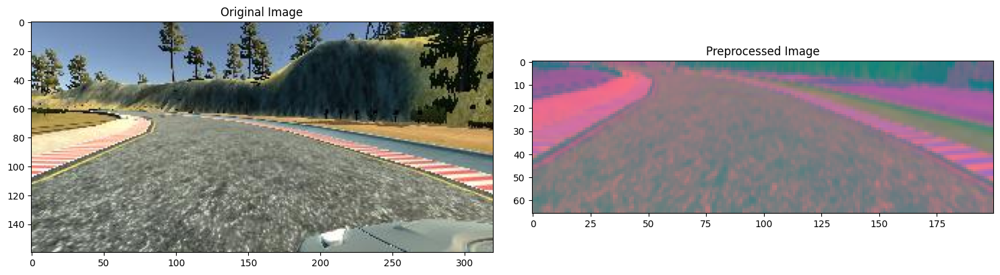

In [70]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [71]:
!nvidia-smi

Tue Dec 12 13:31:33 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 516.40       Driver Version: 516.40       CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   67C    P0    39W /  N/A |     84MiB /  4096MiB |     56%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [72]:
# Huấn luyện mô hình

def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_test_gen, y_valid_gen = next(batch_generator(X_test, y_test, 1, 0))

Text(0.5, 1.0, 'Testing Image')

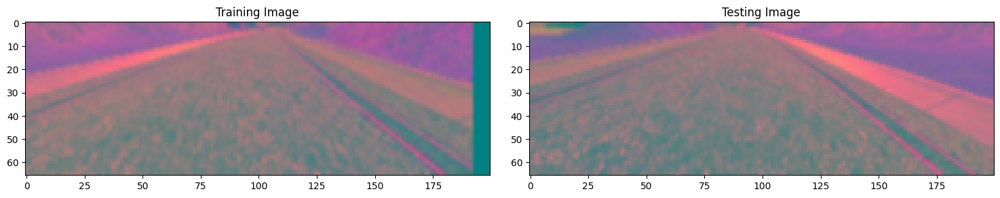

In [73]:

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_test_gen[0])
axs[1].set_title('Testing Image')
     

In [74]:
#  Mô hình dự đoán vô-lăng hoặc hướng lái từ hình ảnh camera trên xe
def nvidia_model():
    model = Sequential()
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu')) # Adjusted filter size
    model.add(Conv2D(64, (3, 3), activation='elu')) # Uncommented this line

    model.add(Flatten())

    model.add(Dense(100, activation='elu', kernel_regularizer=l2(0.001)))
    model.add(Dropout(0.5))

    model.add(Dense(50, activation='elu', kernel_regularizer=l2(0.001)))
    model.add(Dropout(0.5))

    model.add(Dense(10, activation='elu', kernel_regularizer=l2(0.001)))
    model.add(Dropout(0.5))

    model.add(Dense(1))

    optimizer = Adam(learning_rate=1e-4) # Adjusted learning rate
    model.compile(loss='mse', optimizer=optimizer)
    return model

nvidia_model = nvidia_model()
print(nvidia_model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_9 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_10 (Conv2D)          (None, 5, 22, 48)         43248     
                                                                 
 conv2d_11 (Conv2D)          (None, 3, 20, 64)         27712     
                                                                 
 conv2d_12 (Conv2D)          (None, 1, 18, 64)         36928     
                                                                 
 flatten_2 (Flatten)         (None, 1152)              0         
                                                                 
 dense_7 (Dense)             (None, 100)              

In [75]:
history1 = nvidia_model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_test, y_test, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

C:\Users\HELLO\AppData\Local\Temp\ipykernel_16960\1335929224.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history1 = nvidia_model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 552s 2s/step - loss: 0.4683 - val_loss: 0.4251
Epoch 2/10
300/300 [==============================] - 504s 2s/step - loss: 0.4303 - val_loss: 0.3980
Epoch 3/10
300/300 [==============================] - 503s 2s/step - loss: 0.3994 - val_loss: 0.3725
Epoch 4/10
300/300 [==============================] - 526s 2s/step - loss: 0.3735 - val_loss: 0.3478
Epoch 5/10
300/300 [==============================] - 539s 2s/step - loss: 0.3460 - val_loss: 0.3137
Epoch 6/10
300/300 [==============================] - 567s 2s/step - loss: 0.3231 - val_loss: 0.2919
Epoch 7/10
300/300 [==============================] - 597s 2s/step - loss: 0.3003 - val_loss: 0.2740
Epoch 8/10
300/300 [==============================] - 531s 2s/step - loss: 0.2799 - val_loss: 0.2496
Epoch 9/10
300/300 [==============================] - 519s 2s/step - loss: 0.2656 - val_loss: 0.2380
Epoch 10/10
300/300 [==============================] - 529s 2s/step - loss: 0.2493 - val_lo

Text(0.5, 0, 'Epoch')

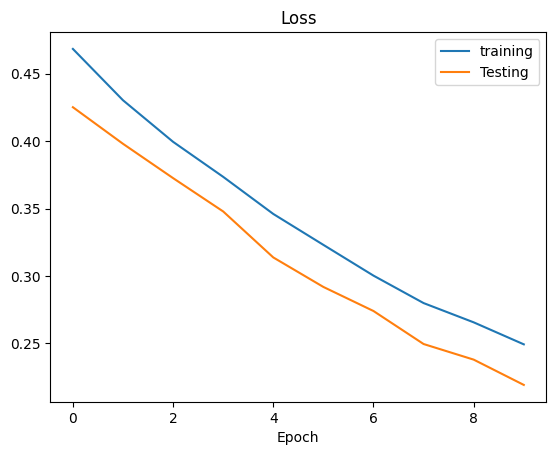

In [76]:
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.legend(['training', 'Testing'])
plt.title('Loss')
plt.xlabel('Epoch')

In [77]:
# Mô hình phát hiện vạch kẻ đường(dự đoán vị trí của vạch kẻ đường)
def build_lane_detection_model():
    model = Sequential()

    # Lớp Convolutional 1
    model.add(Conv2D(16, (3, 3), activation='relu', input_shape=(66, 200, 3)))
    model.add(MaxPooling2D())

    # Lớp Convolutional 2
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D())

    # Lớp Convolutional 3
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D())

    # Flatten để chuyển đổi dữ liệu từ 2D sang 1D
    model.add(Flatten())

    # Lớp Dense với Dropout để tránh overfitting
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))

    # Lớp đầu ra, giả sử chúng ta đang cố gắng dự đoán 2 giá trị: vị trí của hai vạch kẻ đường
    model.add(Dense(2))  # Đầu ra là 2 giá trị

    # Compile model với optimizer và hàm mất mát
    model.compile(optimizer='adam', loss='mean_squared_error')

    return model

# Tạo mô hình và in ra bảng tóm tắt
lane_detection_model = build_lane_detection_model()
print(lane_detection_model.summary())


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_13 (Conv2D)          (None, 64, 198, 16)       448       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 32, 99, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 30, 97, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 15, 48, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 13, 46, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 6, 23, 64)        

In [78]:
history2 = lane_detection_model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_test, y_test, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

C:\Users\HELLO\AppData\Local\Temp\ipykernel_16960\119921906.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history2 = lane_detection_model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 523s 2s/step - loss: 0.1719 - val_loss: 0.1494
Epoch 2/10
300/300 [==============================] - 579s 2s/step - loss: 0.1517 - val_loss: 0.1401
Epoch 3/10
300/300 [==============================] - 596s 2s/step - loss: 0.1440 - val_loss: 0.1276
Epoch 4/10
300/300 [==============================] - 578s 2s/step - loss: 0.1405 - val_loss: 0.1176
Epoch 5/10
300/300 [==============================] - 588s 2s/step - loss: 0.1344 - val_loss: 0.1012
Epoch 6/10
300/300 [==============================] - 587s 2s/step - loss: 0.1279 - val_loss: 0.0933
Epoch 7/10
300/300 [==============================] - 631s 2s/step - loss: 0.1244 - val_loss: 0.0849
Epoch 8/10
300/300 [==============================] - 560s 2s/step - loss: 0.1215 - val_loss: 0.0798
Epoch 9/10
300/300 [==============================] - 566s 2s/step - loss: 0.1161 - val_loss: 0.0806
Epoch 10/10
300/300 [==============================] - 551s 2s/step - loss: 0.1140 - val_lo

Text(0.5, 0, 'Epoch')

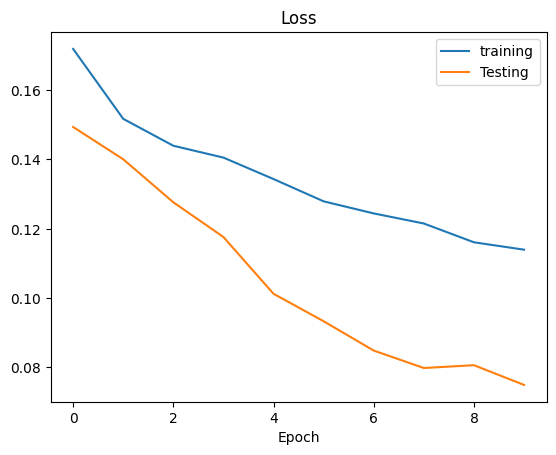

In [79]:
plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
plt.legend(['training', 'Testing'])
plt.title('Loss')
plt.xlabel('Epoch')

In [80]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Concatenate, Dense
from tensorflow.keras.optimizers import Adam

# Tích hợp các mô hình
def build_combined_model(nvidia_model, lane_detection_model):
    # Định nghĩa đầu vào
    input_shape = (66, 200, 3)
    input_layer = Input(shape=input_shape)

    # Sử dụng output từ mỗi mô hình
    nvidia_output = nvidia_model(input_layer)
    lane_output = lane_detection_model(input_layer)

    # Kết hợp đầu ra của cả hai mô hình
    combined_output = Concatenate()([nvidia_output, lane_output])

    # Thêm lớp Dense cuối cùng để đưa ra quyết định
    final_output = Dense(1)(combined_output)

    # Tạo mô hình tổng hợp
    combined_model = Model(inputs=input_layer, outputs=final_output)

    # Compile model
    combined_model.compile(loss='mse', optimizer=Adam(learning_rate=1e-4))

    return combined_model

# Tạo mô hình tổng hợp
combined_model = build_combined_model(nvidia_model, lane_detection_model)
print(combined_model.summary())


In [81]:
history = combined_model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_test, y_test, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)
     

In [82]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'Testing'])
plt.title('Loss')
plt.xlabel('Epoch')

In [83]:
combined_model.save('model1.h5')